In [51]:
from fastai.vision import *
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [52]:
import os
print(os.listdir('/content/drive/My Drive/FinalProjectData'))

['data_greater_than_100', 'outFinalMay.xls', 'Copy of HazardsClassificationModel.ipynb', 'output', '~$נתוני הפניה.xlsx', 'נתוני הפניה.xlsx', 'out.xlsx', 'new_output', 'outFinal.xls', 'data_cleaning', 'outFinal1780-end.xlsx', 'outFinal-until_1779.xls', 'outFinal1780-final.xlsx', 'data', 'data_1', 'HazardsClassificationModel.ipynb', 'out_from_may.xlsx', 'pic_may_19', 'outMayFinalClassifications.xlsx', 'final_merge.xlsx', 'Classes', 'Classes_allData']


Load images into ImageDataBanch

In [0]:
tfms = get_transforms(max_rotate=20, max_zoom=1.3, max_lighting=0.4, max_warp=0.4,
                      p_affine=1., p_lighting=1.)

In [0]:

path=Path("/content/drive/My Drive/FinalProjectData/Classes")
np.random.seed(42)
bs = 64

In [0]:
def get_data(size, bs):
    return ImageDataBunch.from_folder(path, train=".", valid_pct=0.2, num_workers=4,
                                      ds_tfms=tfms, size=size, bs=bs).normalize(imagenet_stats)

In [0]:
data = get_data(224, bs)

Let's see what classes do we have

In [57]:
data.classes, data.c, len(data.train_ds), len(data.valid_ds)

(['Animals',
  'Benches',
  'Cleaning',
  'Electricity&Lighting',
  'Gardening',
  'Parking',
  'Parks&Facilities',
  'Roads&Sidewalks',
  'Safety_Railings \xa0',
  'Sewerage',
  'Traffic_Sign',
  'Water'],
 12,
 4730,
 1182)

Good! Let's take a look at some of our pictures then.

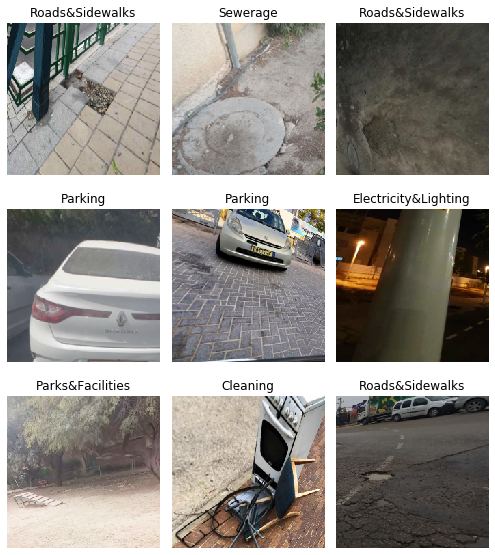

In [58]:
data.show_batch(rows=3, figsize=(7,8))

## Data augmentation

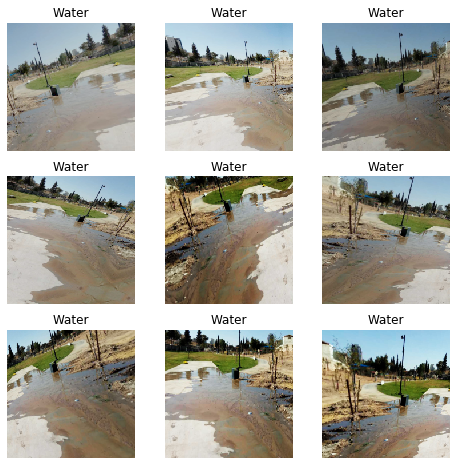

In [0]:
def _plot(i,j,ax):
    x,y = data.train_ds[1]
    x.show(ax, y=y)

plot_multi(_plot, 3, 3, figsize=(8,8))

## Train model

In [0]:
gc.collect()
# create cnn with the resnet50 architecture
top2_acc = partial(top_k_accuracy, k=2)
top3_acc = partial(top_k_accuracy, k=3)
learn = cnn_learner(data, models.resnet50, metrics=[accuracy, top2_acc, top3_acc], bn_final=True)

In [60]:
lr = 0.01
learn.fit_one_cycle(4, slice(lr))

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,top_k_accuracy,time
0,1.709871,1.301096,0.617597,0.763113,0.836717,03:20
1,1.361348,1.020450,0.683587,0.844332,0.902707,03:15
2,1.154464,0.950641,0.700508,0.862098,0.917936,03:14
3,1.057316,0.925186,0.708122,0.868866,0.928088,03:14


In [0]:
data = get_data(352,bs)
learn.data = data

In [0]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


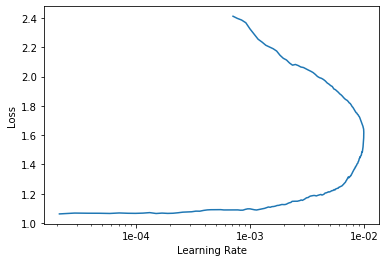

In [62]:
# If the plot is not showing try to give a start and end learning rate
# learn.lr_find(start_lr=1e-5, end_lr=1e-1)
learn.recorder.plot()

In [63]:
learn.fit_one_cycle(3, max_lr=slice(1e-3, 1e-2))

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,top_k_accuracy,time
0,1.093961,0.927903,0.686125,0.856176,0.926396,04:17
1,1.028617,0.832389,0.728426,0.879019,0.932318,04:17
2,0.937470,0.809912,0.742809,0.882403,0.936548,04:17


In [0]:
learn.unfreeze()

In [0]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


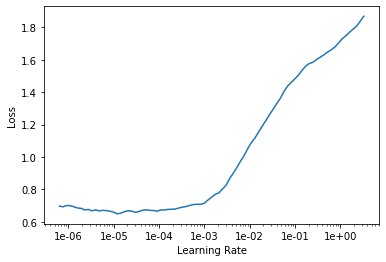

In [0]:
# If the plot is not showing try to give a start and end learning rate
# learn.lr_find(start_lr=1e-5, end_lr=1e-1)
learn.recorder.plot()

Choose learning rate range according the above plot

In [65]:
learn.fit_one_cycle(3, max_lr=slice(1e-5,1e-3))

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,top_k_accuracy,time
0,0.902497,0.890562,0.710660,0.862098,0.928934,04:22
1,0.848033,0.761224,0.751269,0.889171,0.944162,04:20
2,0.722386,0.731121,0.760575,0.900169,0.946701,04:21


In [0]:
learn.save('final_model')

## Cleaning Up

Some of our top losses aren't due to bad performance by our model. There are images in our data set that shouldn't be.

Using the `ImageCleaner` widget from `fastai.widgets` we can prune our top losses, removing photos that don't belong.

In [0]:
from fastai.widgets import *

First we need to get the file paths from our top_losses. We can do this with `.from_toplosses`. We then feed the top losses indexes and corresponding dataset to `ImageCleaner`.

Notice that the widget will not delete images directly from disk but it will create a new csv file `cleaned.csv` from where you can create a new ImageDataBunch with the corrected labels to continue training your model.

In order to clean the entire set of images, we need to create a new dataset without the split. The video lecture demostrated the use of the `ds_type` param which no longer has any effect. See [the thread](https://forums.fast.ai/t/duplicate-widget/30975/10) for more details.

In [0]:
db = (ImageList.from_folder(path)
                   .split_none()
                   .label_from_folder()
                   .transform(get_transforms(), size=224)
                   .databunch()
     )

Then we create a new learner to use our new databunch with all the images.

In [0]:
learn_cln = cnn_learner(db, models.resnet50, metrics=error_rate)

learn_cln.load('stage-1');

RuntimeError: ignored

In [0]:
ds, idxs = DatasetFormatter().from_toplosses(learn_cln)

Make sure you're running this notebook in Jupyter Notebook, not Jupyter Lab. That is accessible via [/tree](/tree), not [/lab](/lab). Running the `ImageCleaner` widget in Jupyter Lab is [not currently supported](https://github.com/fastai/fastai/issues/1539).

In [0]:
# Don't run this in google colab or any other instances running jupyter lab.
# If you do run this on Jupyter Lab, you need to restart your runtime and
# runtime state including all local variables will be lost.
ImageCleaner(ds, idxs, path)

**Flag** photos for deletion by clicking 'Delete'. Then click 'Next Batch' to delete flagged photos and keep the rest in that row. `ImageCleaner` will show you a new row of images until there are no more to show. In this case, the widget will show you images until there are none left from `top_losses.ImageCleaner(ds, idxs)`

**Make sure to recreate the databunch and `learn_cln` from the `cleaned.csv` file. Otherwise the file would be overwritten from scratch, losing all the results from cleaning the data from toplosses.**

You can also find duplicates in your dataset and delete them! To do this, you need to run `.from_similars` to get the potential duplicates' ids and then run `ImageCleaner` with `duplicates=True`. The API works in a similar way as with misclassified images: just choose the ones you want to delete and click 'Next Batch' until there are no more images left.

In [0]:
ds, idxs = DatasetFormatter().from_similars(learn_cln)

In [0]:
ImageCleaner(ds, idxs, path, duplicates=True)

**Remember to recreate your ImageDataBunch from your `cleaned.csv` to include the changes you made in your data!**

In [0]:
df = pd.read_csv(path/'cleaned.csv', header='infer')
print(df.head())

db = (ImageItemList.from_df(df, path)
                   .random_split_by_pct(0.2)
                   .label_from_df()
                   .transform(get_transforms(), size=224)
                   .databunch(bs=8)).normalize(imagenet_stats)

In [0]:
print(data.classes, data.c, len(data.train_ds), len(data.valid_ds))
print(db.classes, db.c, len(db.train_ds), len(db.valid_ds))

In [0]:
learn.load('stage-1') # loading the weights
learn.data = db # replacing the data

learn.freeze()
learn.fit_one_cycle(4)

learn.unfreeze()

learn.lr_find()
learn.recorder.plot()

learn.fit_one_cycle(4, max_lr=slice(3e-5, 3e-4))
learn.save('stage-2')

## Interpretation

Let's see what results we have got. 

We will first see which were the categories that the model most confused with one another. We will try to see if what the model predicted was reasonable or not. In this case the mistakes look reasonable (none of the mistakes seems obviously naive). This is an indicator that our classifier is working correctly. 

Furthermore, when we plot the confusion matrix, we can see that the distribution is heavily skewed: the model makes the same mistakes over and over again but it rarely confuses other categories. This suggests that it just finds it difficult to distinguish some specific categories between each other; this is normal behaviour.

In [0]:
# learn = cnn_learner(data, models.resnet50, metrics=[accuracy, top2_acc, top3_acc], bn_final=True)
learn.load('final_model');

In [68]:
interp = ClassificationInterpretation.from_learner(learn)

losses,idxs = interp.top_losses()

len(data.valid_ds)==len(losses)==len(idxs)

True

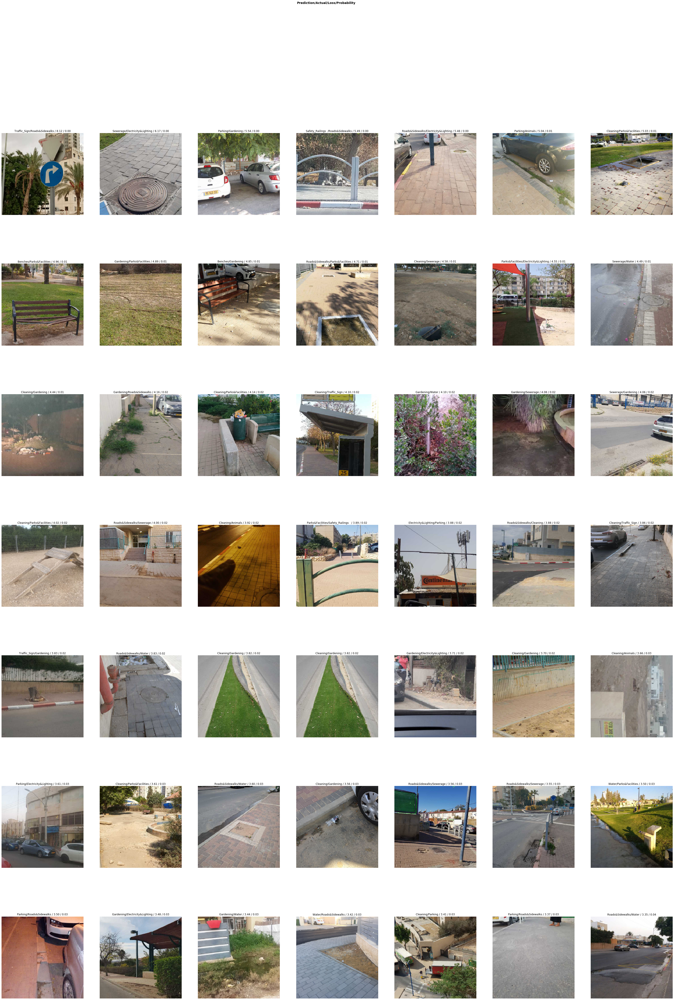

In [69]:
interp.plot_top_losses(49, figsize=(55, 75))

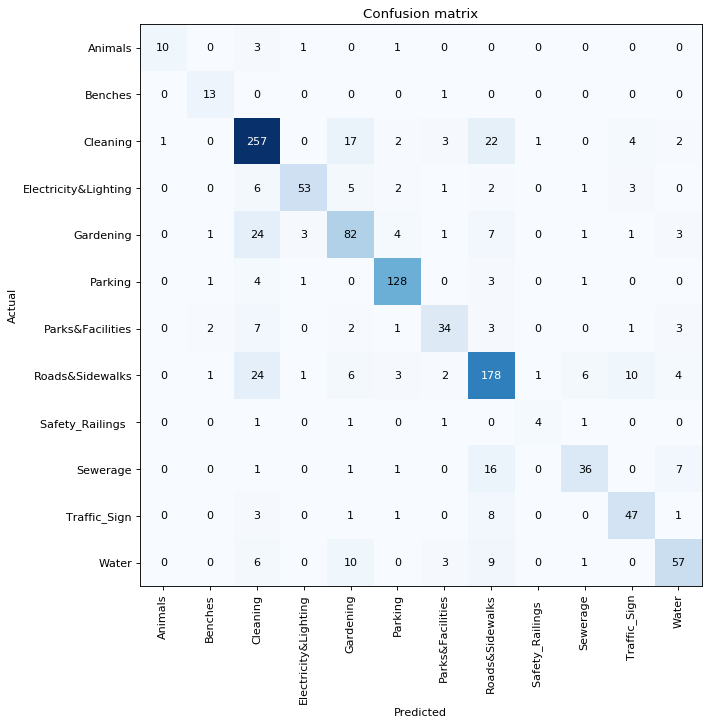

In [71]:
interp.plot_confusion_matrix(figsize=(9,9), dpi=80)

In [72]:
interp.most_confused(min_val=2)

[('Gardening', 'Cleaning', 24),
 ('Roads&Sidewalks', 'Cleaning', 24),
 ('Cleaning', 'Roads&Sidewalks', 22),
 ('Cleaning', 'Gardening', 17),
 ('Sewerage', 'Roads&Sidewalks', 16),
 ('Roads&Sidewalks', 'Traffic_Sign', 10),
 ('Water', 'Gardening', 10),
 ('Water', 'Roads&Sidewalks', 9),
 ('Traffic_Sign', 'Roads&Sidewalks', 8),
 ('Gardening', 'Roads&Sidewalks', 7),
 ('Parks&Facilities', 'Cleaning', 7),
 ('Sewerage', 'Water', 7),
 ('Electricity&Lighting', 'Cleaning', 6),
 ('Roads&Sidewalks', 'Gardening', 6),
 ('Roads&Sidewalks', 'Sewerage', 6),
 ('Water', 'Cleaning', 6),
 ('Electricity&Lighting', 'Gardening', 5),
 ('Cleaning', 'Traffic_Sign', 4),
 ('Gardening', 'Parking', 4),
 ('Parking', 'Cleaning', 4),
 ('Roads&Sidewalks', 'Water', 4),
 ('Animals', 'Cleaning', 3),
 ('Cleaning', 'Parks&Facilities', 3),
 ('Electricity&Lighting', 'Traffic_Sign', 3),
 ('Gardening', 'Electricity&Lighting', 3),
 ('Gardening', 'Water', 3),
 ('Parking', 'Roads&Sidewalks', 3),
 ('Parks&Facilities', 'Roads&Sidewalks'

In [0]:
from fastai.vision.interpret import SegmentationInterpretation

interp = SegmentationInterpretation.from_learner(learn)

# mean_cm, single_img_cm = interp._generate_confusion()

In [0]:
interp.show_xyz(100, sz=15)


In [0]:
i = top_idxs[0]
df = interp._plot_intersect_cm(single_img_cm[i], f"Ratio of Intersection given True Label, Image:{i}")

## Putting your model in production

First thing first, let's export the content of our `Learner` object for production:

In [0]:
learn.export()

This will create a file named 'export.pkl' in the directory where we were working that contains everything we need to deploy our model (the model, the weights but also some metadata like the classes or the transforms/normalization used).

You probably want to use CPU for inference, except at massive scale (and you almost certainly don't need to train in real-time). If you don't have a GPU that happens automatically. You can test your model on CPU like so:

In [0]:
defaults.device = torch.device('cpu')

We create our `Learner` in production enviromnent like this, just make sure that `path` contains the file 'export.pkl' from before.

In [0]:
learn = load_learner(path)

In [0]:
pred_class,pred_idx,outputs = learn.predict(img)
pred_class

Category black

So you might create a route something like this ([thanks](https://github.com/simonw/cougar-or-not) to Simon Willison for the structure of this code):

```python
@app.route("/classify-url", methods=["GET"])
async def classify_url(request):
    bytes = await get_bytes(request.query_params["url"])
    img = open_image(BytesIO(bytes))
    _,_,losses = learner.predict(img)
    return JSONResponse({
        "predictions": sorted(
            zip(cat_learner.data.classes, map(float, losses)),
            key=lambda p: p[1],
            reverse=True
        )
    })
```

(This example is for the [Starlette](https://www.starlette.io/) web app toolkit.)